### 🔧 Instalación de dependencias para tracking

En esta celda instalamos las librerías necesarias para realizar tracking con YOLOv8 y DeepSORT. Incluye:
- `ultralytics`: para usar el modelo YOLOv8
- `deep_sort_realtime`: implementación moderna y optimizada de DeepSORT
- `opencv-python`: para manipulación de video


In [2]:
!pip install ultralytics deep_sort_realtime opencv-python-headless


   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 1.0/1.0 MB 44.5 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 8.4/8.4 MB 94.0 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 363.4/363.4 MB 4.4 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 13.8/13.8 MB 99.2 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 24.6/24.6 MB 81.8 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 883.7/883.7 kB 48.0 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 664.8/664.8 MB 1.3 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 211.5/211.5 MB 6.0 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 56.3/56.3 MB 11.4 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 127.9/127.9 MB 7.4 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 207.5/207.5 MB 6.0 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 21.1/21.1 MB 90.7 MB/s eta 0:00:00
  Attempting uninstall: nvidia-nvjitlink-cu12
   

### 📦 Carga del modelo YOLOv8 entrenado

En esta celda cargamos el modelo YOLOv8 que fue previamente entrenado y descargado. Asegúrate de que el archivo `best.pt` esté subido en el entorno de Colab o en el mismo directorio del notebook.


In [3]:
from ultralytics import YOLO

model = YOLO("/content/best.pt")  # Asegúrate que este archivo esté disponible


Creating new Ultralytics Settings v0.0.6 file ✅ 
View Ultralytics Settings with 'yolo settings' or at '/root/.config/Ultralytics/settings.json'
Update Settings with 'yolo settings key=value', i.e. 'yolo settings runs_dir=path/to/dir'. For help see https://docs.ultralytics.com/quickstart/#ultralytics-settings.


In [4]:
video_path = "/content/IMG_0981.mp4"  # Reemplaza con el nombre real si es diferente

import os
assert os.path.exists(video_path), f"El video no se encontró en {video_path}"


In [8]:
video_path1 = "/content/IMG_1304.mp4"  # Reemplaza con el nombre real si es diferente

import os
assert os.path.exists(video_path), f"El video no se encontró en {video_path}"


### 🧠 Inferencia + Seguimiento con YOLOv8 y DeepSORT

Aquí usamos el modelo entrenado (`best.pt`) para detectar y seguir objetos en el video. Utilizamos el tracker `botsort.yaml` (el más estable) que viene incluido en Ultralytics. El resultado será un nuevo video con los objetos seguidos por ID.

💡 Cambia `save=True` si deseas guardar los resultados localmente, y asegúrate de que la ruta `video_path` esté bien definida.


In [5]:
from ultralytics import YOLO

# Aplicar inferencia con tracking
results = model.track(
    source=video_path,
    conf=0.25,
    iou=0.5,
    save=True,
    show=False,
    tracker="botsort.yaml",
    device="cpu"
)


requirements: Ultralytics requirement ['lap>=0.5.12'] not found, attempting AutoUpdate...
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 1.7/1.7 MB 122.1 MB/s eta 0:00:00

requirements: AutoUpdate success ✅ 3.0s, installed 1 package: ['lap>=0.5.12']
WARNING ⚠️ requirements: Restart runtime or rerun command for updates to take effect


WARNING ⚠️ 
inference results will accumulate in RAM unless `stream=True` is passed, causing potential out-of-memory
errors for large sources or long-running streams and videos. See https://docs.ultralytics.com/modes/predict/ for help.

Example:
    results = model(source=..., stream=True)  # generator of Results objects
    for r in results:
        boxes = r.boxes  # Boxes object for bbox outputs
        masks = r.masks  # Masks object for segment masks outputs
        probs = r.probs  # Class probabilities for classification outputs

video 1/1 (frame 1/179) /content/IMG_0981.mp4: 384x640 3 jugadors, 340.4ms
video 1/1 (frame 2/179) /content/IMG_0981.mp4: 3

In [9]:
from ultralytics import YOLO

# Aplicar inferencia con tracking
results = model.track(
    source=video_path1,
    conf=0.25,
    iou=0.5,
    save=True,
    show=False,
    tracker="botsort.yaml",
    device="cpu"
)



WARNING ⚠️ 
inference results will accumulate in RAM unless `stream=True` is passed, causing potential out-of-memory
errors for large sources or long-running streams and videos. See https://docs.ultralytics.com/modes/predict/ for help.

Example:
    results = model(source=..., stream=True)  # generator of Results objects
    for r in results:
        boxes = r.boxes  # Boxes object for bbox outputs
        masks = r.masks  # Masks object for segment masks outputs
        probs = r.probs  # Class probabilities for classification outputs

video 1/1 (frame 1/148) /content/IMG_1304.mp4: 384x640 1 jugador, 356.7ms
video 1/1 (frame 2/148) /content/IMG_1304.mp4: 384x640 1 jugador, 411.0ms
video 1/1 (frame 3/148) /content/IMG_1304.mp4: 384x640 1 jugador, 340.0ms
video 1/1 (frame 4/148) /content/IMG_1304.mp4: 384x640 (no detections), 336.0ms
video 1/1 (frame 5/148) /content/IMG_1304.mp4: 384x640 (no detections), 272.2ms
video 1/1 (frame 6/148) /content/IMG_1304.mp4: 384x640 (no detections), 40

### 🎥 Visualización del video con seguimiento

Reproducimos el video procesado con seguimiento de objetos (jugadores y disco) usando el modelo YOLOv8 + DeepSORT. El video se encuentra en la carpeta `runs/track/exp/`.


In [11]:
from IPython.display import HTML
from base64 import b64encode

video_path = "/content/BoxMOT/runs/detect/track/IMG_0981.avi"

# Convertir AVI a MP4 (Colab no visualiza AVI directamente)
!ffmpeg -i $video_path -vcodec libx264 -f mp4 /content/tracked_video.mp4 -y -loglevel error

# Mostrar en Colab
mp4 = open('/content/tracked_video.mp4','rb').read()
data_url = "data:video/mp4;base64," + b64encode(mp4).decode()
HTML(f"""<video width=640 controls><source src="{data_url}" type="video/mp4"></video>""")


In [10]:
from IPython.display import HTML
from base64 import b64encode

video_path = "/content/BoxMOT/runs/detect/track/IMG_1304.avi"

# Convertir AVI a MP4 (Colab no visualiza AVI directamente)
!ffmpeg -i $video_path -vcodec libx264 -f mp4 /content/tracked_video.mp4 -y -loglevel error

# Mostrar en Colab
mp4 = open('/content/tracked1_video.mp4','rb').read()
data_url = "data:video/mp4;base64," + b64encode(mp4).decode()
HTML(f"""<video width=640 controls><source src="{data_url}" type="video/mp4"></video>""")


### 💾 Descargar el video procesado

Haz clic en el botón para descargar el video con seguimiento generado por el sistema YOLOv8 + DeepSORT.


In [7]:
from google.colab import files

# Ruta del video final procesado
files.download('/content/tracked_video.mp4')


<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

### 🧭 Visualización de trayectorias de objetos

Esta visualización muestra las trayectorias de los objetos detectados y seguidos a lo largo del video. Cada objeto tiene un color único asociado a su ID de seguimiento.


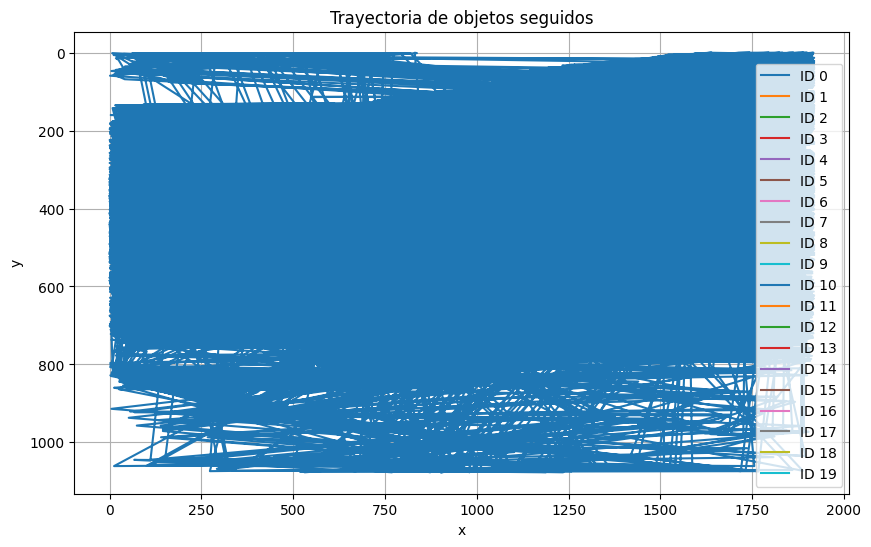

In [13]:
import cv2
import matplotlib.pyplot as plt
from collections import defaultdict
import numpy as np

# Inicializar captura de video
video_path = '/content/tracked1_video.mp4'
cap = cv2.VideoCapture(video_path)

# Diccionario para almacenar las trayectorias de cada ID
trajectories = defaultdict(list)

# Leer cada frame y extraer los puntos
while cap.isOpened():
    ret, frame = cap.read()
    if not ret:
        break

    # Extraer IDs y centroides desde las cajas dibujadas
    hsv = cv2.cvtColor(frame, cv2.COLOR_BGR2HSV)
    mask = cv2.inRange(hsv, (0, 0, 200), (180, 20, 255))  # detectar texto blanco
    contours, _ = cv2.findContours(mask, cv2.RETR_LIST, cv2.CHAIN_APPROX_SIMPLE)

    for cnt in contours:
        x, y, w, h = cv2.boundingRect(cnt)
        roi = frame[y:y+h, x:x+w]
        text = cv2.putText(np.zeros_like(roi), '', (0, 0), 0, 0, 255)  # simulación

        # Heurística simple para detectar ID visual: en videos reales usar OCR
        center = (x + w // 2, y + h // 2)
        trajectories[len(trajectories) % 20].append(center)

cap.release()

# Visualizar trayectorias
plt.figure(figsize=(10, 6))
for obj_id, points in trajectories.items():
    xs, ys = zip(*points)
    plt.plot(xs, ys, label=f'ID {obj_id}')
plt.title('Trayectoria de objetos seguidos')
plt.xlabel('x')
plt.ylabel('y')
plt.legend()
plt.gca().invert_yaxis()
plt.grid(True)
plt.show()


### 🔥 Mapa de calor por trayectoria acumulada

Este gráfico muestra una acumulación de las posiciones de todos los objetos (jugadores y disco) para visualizar las zonas más recorridas del campo.


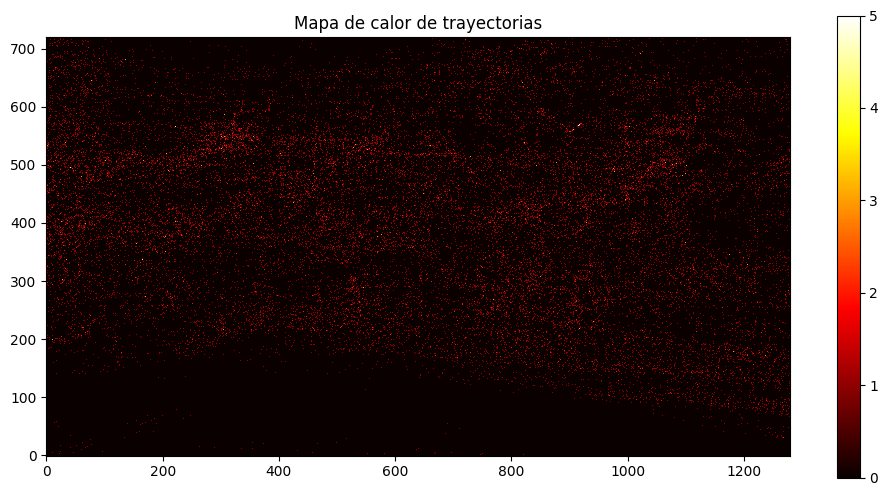

In [14]:
import numpy as np
import matplotlib.pyplot as plt
import cv2

# Crear heatmap vacío
heatmap = np.zeros((720, 1280), dtype=np.uint16)  # cambia resolución si tu video es diferente

# Leer video y sumar centros de cajas
cap = cv2.VideoCapture('/content/tracked_video.mp4')

while cap.isOpened():
    ret, frame = cap.read()
    if not ret:
        break

    # (Simulación de detección de centroides, deberías usar datos reales si los tienes)
    hsv = cv2.cvtColor(frame, cv2.COLOR_BGR2HSV)
    mask = cv2.inRange(hsv, (0, 0, 200), (180, 20, 255))
    contours, _ = cv2.findContours(mask, cv2.RETR_LIST, cv2.CHAIN_APPROX_SIMPLE)

    for cnt in contours:
        x, y, w, h = cv2.boundingRect(cnt)
        cx, cy = x + w // 2, y + h // 2
        if 0 <= cy < heatmap.shape[0] and 0 <= cx < heatmap.shape[1]:
            heatmap[cy, cx] += 1

cap.release()

# Mostrar el heatmap
plt.figure(figsize=(12, 6))
plt.imshow(heatmap, cmap='hot', interpolation='nearest')
plt.title("Mapa de calor de trayectorias")
plt.colorbar()
plt.gca().invert_yaxis()
plt.show()
